Code for **super-resolution** (figures $1$ and $5$ from main paper).. Change `factor` to $8$ to reproduce images from fig. $9$ from supmat.

You can play with parameters and see how they affect the result. 

In [1]:
"""
*Uncomment if running on colab* 
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab 
"""
!git clone https://github.com/ritusingla/deep-image-prior
!mv deep-image-prior/* ./

Cloning into 'deep-image-prior'...
remote: Enumerating objects: 209, done.
remote: Counting objects: 100% (209/209), done.
remote: Compressing objects: 100% (167/167), done.
remote: Total 517 (delta 63), reused 149 (delta 41), pack-reused 308
Receiving objects: 100% (517/517), 182.46 MiB | 13.05 MiB/s, done.
Resolving deltas: 100% (226/226), done.
Checking out files: 100% (248/248), done.


# Import libs

In [0]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import argparse
import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models import *

import torch
import torch.optim

from skimage.measure import compare_psnr
from models.downsampler import Downsampler

from utils.sr_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize = -1 
factor = 4 # 8
enforse_div32 = 'CROP' # we usually need the dimensions to be divisible by a power of two (32 in this case)
PLOT = True

# To produce images from the paper we took *_GT.png images from LapSRN viewer for corresponding factor,
# e.g. x4/zebra_GT.png for factor=4, and x8/zebra_GT.png for factor=8 
path_to_image = 'data/sr/zebra_GT.png'

# Load image and baselines

HR and LR resolutions: (576, 384), (144, 96)


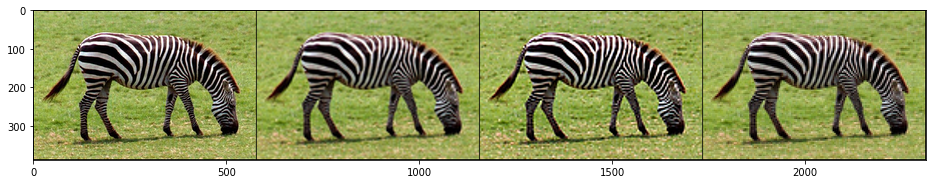

PSNR bicubic: 23.1048   PSNR nearest: 20.8212


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  # Remove the CWD from sys.path while we load stuff.


In [3]:
# Starts here
imgs = load_LR_HR_imgs_sr(path_to_image , imsize, factor, enforse_div32)

imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np'] = get_baselines(imgs['LR_pil'], imgs['HR_pil'])

if PLOT:
    plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np']], 4,12);
    print ('PSNR bicubic: %.4f   PSNR nearest: %.4f' %  (
                                        compare_psnr(imgs['HR_np'], imgs['bicubic_np']), 
                                        compare_psnr(imgs['HR_np'], imgs['nearest_np'])))

# Set up parameters and net

In [0]:
input_depth = 32
 
INPUT =     'noise'
pad   =     'reflection'
OPT_OVER =  'net'
KERNEL_TYPE='lanczos2'

LR = 0.01
tv_weight = 0.0

OPTIMIZER = 'adam'

if factor == 4: 
    num_iter = 2000
    reg_noise_std = 0.03
elif factor == 8:
    num_iter = 4000
    reg_noise_std = 0.05
else:
    assert False, 'We did not experiment with other factors'

In [0]:
net_input = get_noise(input_depth, INPUT, (imgs['HR_pil'].size[1], imgs['HR_pil'].size[0])).type(dtype).detach()

NET_TYPE = 'skip' # UNet, ResNet
net = get_net(input_depth, 'skip', pad,
              skip_n33d=128, 
              skip_n33u=128, 
              skip_n11=4, 
              num_scales=5,
              upsample_mode='bilinear').type(dtype)

# Losses
mse = torch.nn.MSELoss().type(dtype)

img_LR_var = np_to_torch(imgs['LR_np']).type(dtype)

downsampler = Downsampler(n_planes=3, factor=factor, kernel_type=KERNEL_TYPE, phase=0.5, preserve_size=True).type(dtype)

# Define closure and optimize

In [0]:
loss=[]
def closure():
    global i, net_input,loss
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out_HR = net(net_input)
    out_LR = downsampler(out_HR)

    total_loss = mse(out_LR, img_LR_var) 
    loss=np.append(loss,total_loss.item())
    
    if tv_weight > 0:
        total_loss += tv_weight * tv_loss(out_HR)
        
    total_loss.backward()

    # Log
    psnr_LR = compare_psnr(imgs['LR_np'], torch_to_np(out_LR))
    psnr_HR = compare_psnr(imgs['HR_np'], torch_to_np(out_HR))
    print ('Iteration %05d    PSNR_LR %.3f   PSNR_HR %.3f' % (i, psnr_LR, psnr_HR), sep='\r', end='')
                      
    # History
    psnr_history.append([psnr_LR, psnr_HR])
    
    if PLOT and i % 100 == 0:
        out_HR_np = torch_to_np(out_HR)
        plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], np.clip(out_HR_np, 0, 1)], factor=13, nrow=3)

    i += 1
    
    return total_loss

Starting optimization with ADAM


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


Iteration 00000    PSNR_LR 10.854   PSNR_HR 10.515

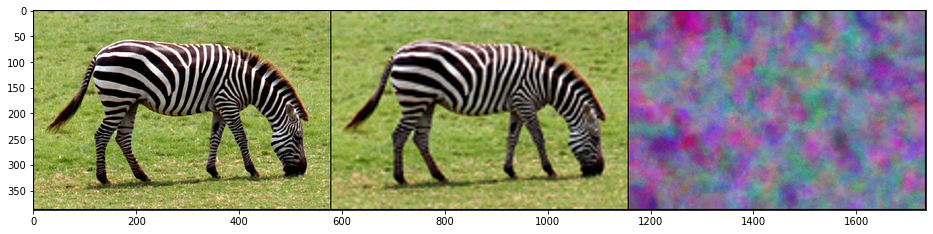

Iteration 00001    PSNR_LR 11.283   PSNR_HR 10.930Iteration 00002    PSNR_LR 12.369   PSNR_HR 11.942Iteration 00003    PSNR_LR 11.206   PSNR_HR 10.862Iteration 00004    PSNR_LR 13.237   PSNR_HR 12.717Iteration 00005    PSNR_LR 13.520   PSNR_HR 12.971Iteration 00006    PSNR_LR 13.649   PSNR_HR 13.089Iteration 00007    PSNR_LR 14.049   PSNR_HR 13.448Iteration 00008    PSNR_LR 14.267   PSNR_HR 13.644Iteration 00009    PSNR_LR 14.414   PSNR_HR 13.780Iteration 00010    PSNR_LR 14.425   PSNR_HR 13.796Iteration 00011    PSNR_LR 14.791   PSNR_HR 14.110Iteration 00012    PSNR_LR 14.854   PSNR_HR 14.159Iteration 00013    PSNR_LR 14.723   PSNR_HR 14.039Iteration 00014    PSNR_LR 14.963   PSNR_HR 14.247Iteration 00015    PSNR_LR 15.108   PSNR_HR 14.379Iteration 00016    PSNR_LR 15.129   PSNR_HR 14.396Iteration 00017    PSNR_LR 15.167   PSNR_HR 14.428Iteration 00018    PSNR_LR 15.214   PSNR_HR 14.461Iteration 00019    PSNR_LR 15.291   PSNR_HR 14.527Iteration 00020    PSNR_LR 15.477   PSNR_HR 14.680

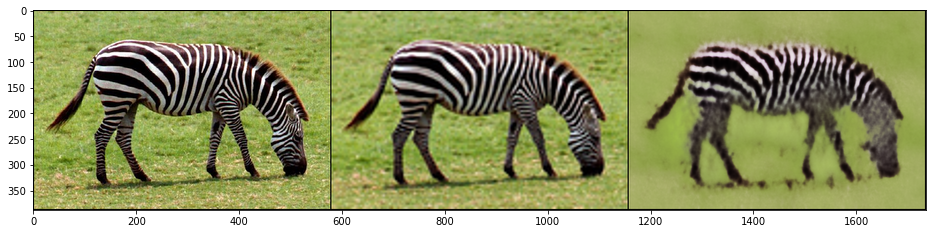

Iteration 00101    PSNR_LR 20.279   PSNR_HR 18.378Iteration 00102    PSNR_LR 20.432   PSNR_HR 18.486Iteration 00103    PSNR_LR 20.199   PSNR_HR 18.283Iteration 00104    PSNR_LR 20.324   PSNR_HR 18.395Iteration 00105    PSNR_LR 20.389   PSNR_HR 18.447Iteration 00106    PSNR_LR 20.469   PSNR_HR 18.499Iteration 00107    PSNR_LR 20.539   PSNR_HR 18.557Iteration 00108    PSNR_LR 20.570   PSNR_HR 18.595Iteration 00109    PSNR_LR 20.406   PSNR_HR 18.457Iteration 00110    PSNR_LR 20.699   PSNR_HR 18.681Iteration 00111    PSNR_LR 20.760   PSNR_HR 18.722Iteration 00112    PSNR_LR 20.539   PSNR_HR 18.550Iteration 00113    PSNR_LR 20.676   PSNR_HR 18.639Iteration 00114    PSNR_LR 20.913   PSNR_HR 18.809Iteration 00115    PSNR_LR 20.914   PSNR_HR 18.829Iteration 00116    PSNR_LR 20.820   PSNR_HR 18.775Iteration 00117    PSNR_LR 20.912   PSNR_HR 18.803Iteration 00118    PSNR_LR 21.000   PSNR_HR 18.879Iteration 00119    PSNR_LR 21.084   PSNR_HR 18.912Iteration 00120    PSNR_LR 21.144   PSNR_HR 18.968

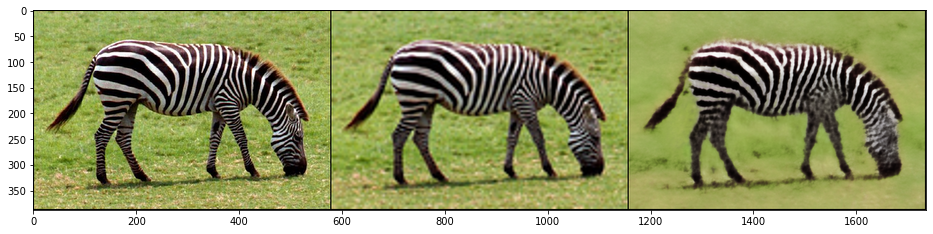

Iteration 00201    PSNR_LR 22.858   PSNR_HR 20.113Iteration 00202    PSNR_LR 23.027   PSNR_HR 20.213Iteration 00203    PSNR_LR 23.106   PSNR_HR 20.224Iteration 00204    PSNR_LR 23.138   PSNR_HR 20.255Iteration 00205    PSNR_LR 23.173   PSNR_HR 20.304Iteration 00206    PSNR_LR 23.101   PSNR_HR 20.268Iteration 00207    PSNR_LR 23.115   PSNR_HR 20.281Iteration 00208    PSNR_LR 23.260   PSNR_HR 20.373Iteration 00209    PSNR_LR 23.337   PSNR_HR 20.395Iteration 00210    PSNR_LR 23.219   PSNR_HR 20.304Iteration 00211    PSNR_LR 23.238   PSNR_HR 20.309Iteration 00212    PSNR_LR 23.342   PSNR_HR 20.394Iteration 00213    PSNR_LR 23.316   PSNR_HR 20.431Iteration 00214    PSNR_LR 23.378   PSNR_HR 20.398Iteration 00215    PSNR_LR 23.477   PSNR_HR 20.475Iteration 00216    PSNR_LR 23.279   PSNR_HR 20.377Iteration 00217    PSNR_LR 23.347   PSNR_HR 20.393Iteration 00218    PSNR_LR 23.291   PSNR_HR 20.361Iteration 00219    PSNR_LR 23.437   PSNR_HR 20.469Iteration 00220    PSNR_LR 23.412   PSNR_HR 20.444

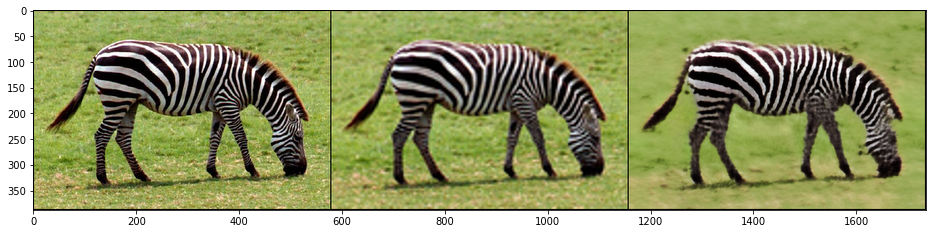

Iteration 00301    PSNR_LR 24.623   PSNR_HR 21.135Iteration 00302    PSNR_LR 24.464   PSNR_HR 21.003Iteration 00303    PSNR_LR 24.592   PSNR_HR 21.074Iteration 00304    PSNR_LR 24.424   PSNR_HR 21.081Iteration 00305    PSNR_LR 24.529   PSNR_HR 21.139Iteration 00306    PSNR_LR 24.508   PSNR_HR 21.125Iteration 00307    PSNR_LR 24.564   PSNR_HR 21.092Iteration 00308    PSNR_LR 24.738   PSNR_HR 21.233Iteration 00309    PSNR_LR 24.706   PSNR_HR 21.213Iteration 00310    PSNR_LR 24.770   PSNR_HR 21.227Iteration 00311    PSNR_LR 24.563   PSNR_HR 21.114Iteration 00312    PSNR_LR 24.925   PSNR_HR 21.333Iteration 00313    PSNR_LR 24.813   PSNR_HR 21.293Iteration 00314    PSNR_LR 24.840   PSNR_HR 21.259Iteration 00315    PSNR_LR 24.900   PSNR_HR 21.289Iteration 00316    PSNR_LR 24.848   PSNR_HR 21.243Iteration 00317    PSNR_LR 24.957   PSNR_HR 21.333Iteration 00318    PSNR_LR 25.015   PSNR_HR 21.374Iteration 00319    PSNR_LR 24.987   PSNR_HR 21.340Iteration 00320    PSNR_LR 25.031   PSNR_HR 21.422

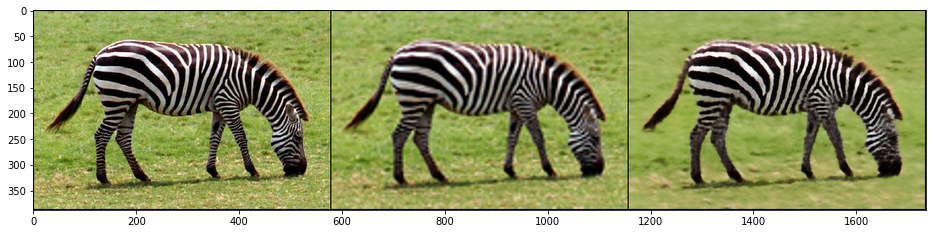

Iteration 00401    PSNR_LR 25.756   PSNR_HR 21.821Iteration 00402    PSNR_LR 25.995   PSNR_HR 21.857Iteration 00403    PSNR_LR 25.950   PSNR_HR 21.818Iteration 00404    PSNR_LR 26.082   PSNR_HR 21.869Iteration 00405    PSNR_LR 26.013   PSNR_HR 21.866Iteration 00406    PSNR_LR 26.006   PSNR_HR 21.851Iteration 00407    PSNR_LR 26.208   PSNR_HR 21.986Iteration 00408    PSNR_LR 26.209   PSNR_HR 21.944Iteration 00409    PSNR_LR 26.088   PSNR_HR 21.890Iteration 00410    PSNR_LR 26.199   PSNR_HR 21.966Iteration 00411    PSNR_LR 26.222   PSNR_HR 22.015Iteration 00412    PSNR_LR 26.189   PSNR_HR 22.014Iteration 00413    PSNR_LR 26.240   PSNR_HR 21.952Iteration 00414    PSNR_LR 26.128   PSNR_HR 21.911Iteration 00415    PSNR_LR 26.158   PSNR_HR 21.912Iteration 00416    PSNR_LR 26.231   PSNR_HR 21.977Iteration 00417    PSNR_LR 26.299   PSNR_HR 21.960Iteration 00418    PSNR_LR 26.149   PSNR_HR 21.934Iteration 00419    PSNR_LR 26.203   PSNR_HR 21.974Iteration 00420    PSNR_LR 26.282   PSNR_HR 22.008

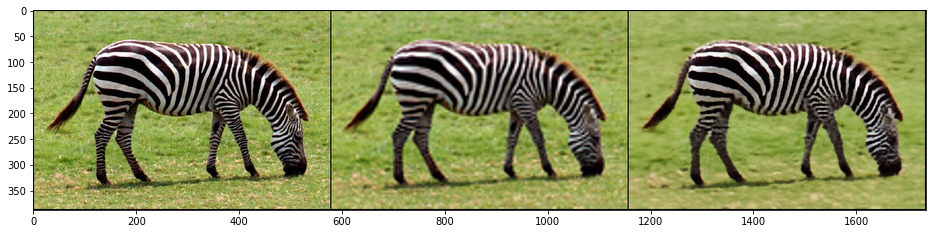

Iteration 00501    PSNR_LR 27.066   PSNR_HR 22.384Iteration 00502    PSNR_LR 27.016   PSNR_HR 22.333Iteration 00503    PSNR_LR 27.089   PSNR_HR 22.370Iteration 00504    PSNR_LR 27.031   PSNR_HR 22.363Iteration 00505    PSNR_LR 27.034   PSNR_HR 22.354Iteration 00506    PSNR_LR 27.032   PSNR_HR 22.375Iteration 00507    PSNR_LR 26.920   PSNR_HR 22.262Iteration 00508    PSNR_LR 27.013   PSNR_HR 22.383Iteration 00509    PSNR_LR 27.078   PSNR_HR 22.387Iteration 00510    PSNR_LR 27.080   PSNR_HR 22.374Iteration 00511    PSNR_LR 27.185   PSNR_HR 22.408Iteration 00512    PSNR_LR 27.030   PSNR_HR 22.336Iteration 00513    PSNR_LR 27.070   PSNR_HR 22.392Iteration 00514    PSNR_LR 27.024   PSNR_HR 22.381Iteration 00515    PSNR_LR 27.233   PSNR_HR 22.432Iteration 00516    PSNR_LR 26.904   PSNR_HR 22.300Iteration 00517    PSNR_LR 27.029   PSNR_HR 22.405Iteration 00518    PSNR_LR 27.025   PSNR_HR 22.352Iteration 00519    PSNR_LR 26.985   PSNR_HR 22.347Iteration 00520    PSNR_LR 26.899   PSNR_HR 22.385

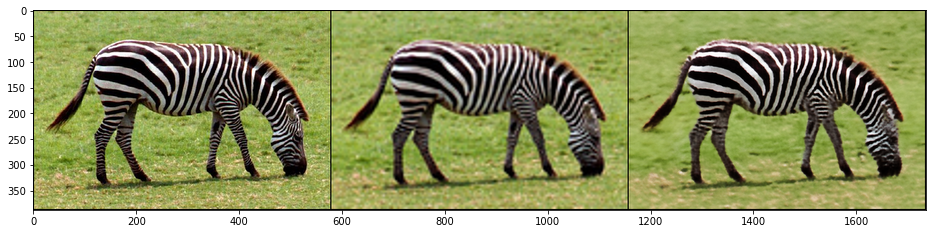

Iteration 00601    PSNR_LR 27.519   PSNR_HR 22.545Iteration 00602    PSNR_LR 27.864   PSNR_HR 22.684Iteration 00603    PSNR_LR 27.641   PSNR_HR 22.578Iteration 00604    PSNR_LR 27.872   PSNR_HR 22.685Iteration 00605    PSNR_LR 27.831   PSNR_HR 22.673Iteration 00606    PSNR_LR 27.867   PSNR_HR 22.684Iteration 00607    PSNR_LR 27.895   PSNR_HR 22.752Iteration 00608    PSNR_LR 27.698   PSNR_HR 22.623Iteration 00609    PSNR_LR 27.946   PSNR_HR 22.753Iteration 00610    PSNR_LR 28.041   PSNR_HR 22.766Iteration 00611    PSNR_LR 27.827   PSNR_HR 22.678Iteration 00612    PSNR_LR 27.991   PSNR_HR 22.741Iteration 00613    PSNR_LR 27.870   PSNR_HR 22.742Iteration 00614    PSNR_LR 27.836   PSNR_HR 22.711Iteration 00615    PSNR_LR 27.819   PSNR_HR 22.693Iteration 00616    PSNR_LR 27.999   PSNR_HR 22.723Iteration 00617    PSNR_LR 27.878   PSNR_HR 22.687Iteration 00618    PSNR_LR 27.869   PSNR_HR 22.690Iteration 00619    PSNR_LR 27.795   PSNR_HR 22.661Iteration 00620    PSNR_LR 28.074   PSNR_HR 22.747

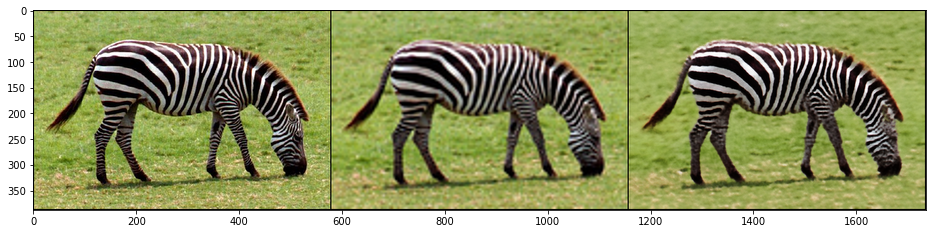

Iteration 00701    PSNR_LR 28.327   PSNR_HR 22.877Iteration 00702    PSNR_LR 28.388   PSNR_HR 22.916Iteration 00703    PSNR_LR 28.257   PSNR_HR 22.824Iteration 00704    PSNR_LR 28.263   PSNR_HR 22.807Iteration 00705    PSNR_LR 28.216   PSNR_HR 22.888Iteration 00706    PSNR_LR 28.380   PSNR_HR 22.916Iteration 00707    PSNR_LR 28.326   PSNR_HR 22.857Iteration 00708    PSNR_LR 28.491   PSNR_HR 22.948Iteration 00709    PSNR_LR 28.440   PSNR_HR 22.943Iteration 00710    PSNR_LR 28.527   PSNR_HR 22.979Iteration 00711    PSNR_LR 28.425   PSNR_HR 22.866Iteration 00712    PSNR_LR 28.538   PSNR_HR 22.943Iteration 00713    PSNR_LR 28.392   PSNR_HR 22.903Iteration 00714    PSNR_LR 28.608   PSNR_HR 22.977Iteration 00715    PSNR_LR 28.591   PSNR_HR 23.001Iteration 00716    PSNR_LR 28.413   PSNR_HR 22.944Iteration 00717    PSNR_LR 28.580   PSNR_HR 22.979Iteration 00718    PSNR_LR 28.276   PSNR_HR 22.811Iteration 00719    PSNR_LR 28.541   PSNR_HR 22.970Iteration 00720    PSNR_LR 28.518   PSNR_HR 22.970

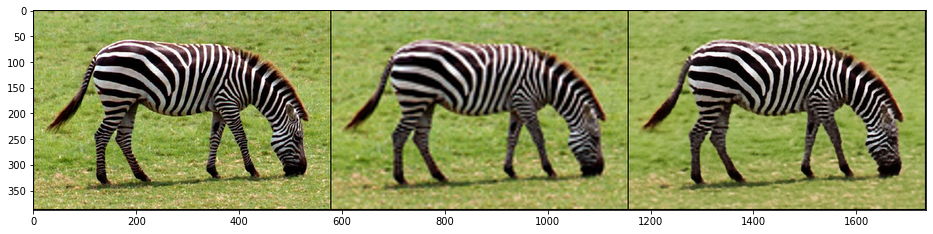

Iteration 00801    PSNR_LR 29.052   PSNR_HR 23.141Iteration 00802    PSNR_LR 28.890   PSNR_HR 23.058Iteration 00803    PSNR_LR 28.964   PSNR_HR 23.062Iteration 00804    PSNR_LR 28.982   PSNR_HR 23.059Iteration 00805    PSNR_LR 29.113   PSNR_HR 23.123Iteration 00806    PSNR_LR 29.058   PSNR_HR 23.187Iteration 00807    PSNR_LR 28.952   PSNR_HR 23.183Iteration 00808    PSNR_LR 28.966   PSNR_HR 23.127Iteration 00809    PSNR_LR 28.940   PSNR_HR 23.134Iteration 00810    PSNR_LR 29.002   PSNR_HR 23.134Iteration 00811    PSNR_LR 29.112   PSNR_HR 23.129Iteration 00812    PSNR_LR 29.095   PSNR_HR 23.119Iteration 00813    PSNR_LR 29.106   PSNR_HR 23.126Iteration 00814    PSNR_LR 29.057   PSNR_HR 23.148Iteration 00815    PSNR_LR 29.225   PSNR_HR 23.156Iteration 00816    PSNR_LR 29.127   PSNR_HR 23.103Iteration 00817    PSNR_LR 29.236   PSNR_HR 23.194Iteration 00818    PSNR_LR 29.028   PSNR_HR 23.132Iteration 00819    PSNR_LR 29.041   PSNR_HR 23.103Iteration 00820    PSNR_LR 28.987   PSNR_HR 23.142

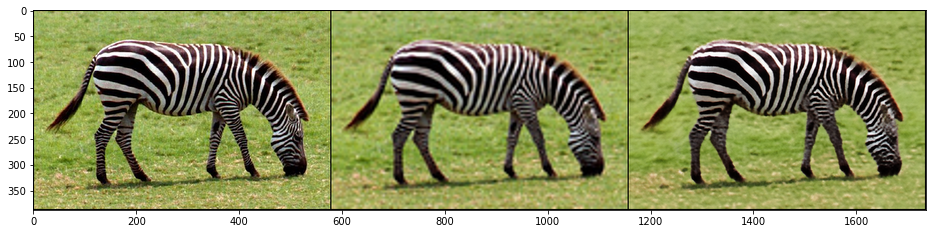

Iteration 00901    PSNR_LR 29.581   PSNR_HR 23.256Iteration 00902    PSNR_LR 29.519   PSNR_HR 23.296Iteration 00903    PSNR_LR 29.474   PSNR_HR 23.260Iteration 00904    PSNR_LR 29.311   PSNR_HR 23.169Iteration 00905    PSNR_LR 29.624   PSNR_HR 23.308Iteration 00906    PSNR_LR 29.588   PSNR_HR 23.273Iteration 00907    PSNR_LR 29.387   PSNR_HR 23.214Iteration 00908    PSNR_LR 29.625   PSNR_HR 23.350Iteration 00909    PSNR_LR 29.214   PSNR_HR 23.246Iteration 00910    PSNR_LR 29.451   PSNR_HR 23.200Iteration 00911    PSNR_LR 29.356   PSNR_HR 23.279Iteration 00912    PSNR_LR 29.595   PSNR_HR 23.311Iteration 00913    PSNR_LR 29.393   PSNR_HR 23.212Iteration 00914    PSNR_LR 29.155   PSNR_HR 23.162Iteration 00915    PSNR_LR 29.584   PSNR_HR 23.264Iteration 00916    PSNR_LR 29.328   PSNR_HR 23.215Iteration 00917    PSNR_LR 29.610   PSNR_HR 23.307Iteration 00918    PSNR_LR 29.536   PSNR_HR 23.283Iteration 00919    PSNR_LR 29.519   PSNR_HR 23.264Iteration 00920    PSNR_LR 29.598   PSNR_HR 23.278

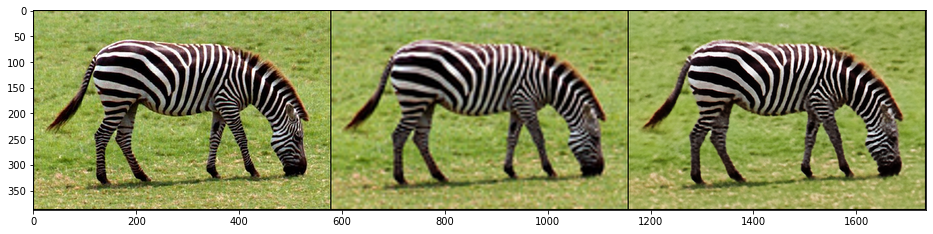

Iteration 01001    PSNR_LR 29.781   PSNR_HR 23.345Iteration 01002    PSNR_LR 29.687   PSNR_HR 23.358Iteration 01003    PSNR_LR 29.938   PSNR_HR 23.390Iteration 01004    PSNR_LR 29.994   PSNR_HR 23.381Iteration 01005    PSNR_LR 29.873   PSNR_HR 23.387Iteration 01006    PSNR_LR 29.811   PSNR_HR 23.279Iteration 01007    PSNR_LR 29.991   PSNR_HR 23.372Iteration 01008    PSNR_LR 30.007   PSNR_HR 23.398Iteration 01009    PSNR_LR 29.932   PSNR_HR 23.389Iteration 01010    PSNR_LR 29.930   PSNR_HR 23.366Iteration 01011    PSNR_LR 30.147   PSNR_HR 23.490Iteration 01012    PSNR_LR 30.010   PSNR_HR 23.409Iteration 01013    PSNR_LR 29.882   PSNR_HR 23.405Iteration 01014    PSNR_LR 30.136   PSNR_HR 23.436Iteration 01015    PSNR_LR 29.980   PSNR_HR 23.396Iteration 01016    PSNR_LR 29.772   PSNR_HR 23.321Iteration 01017    PSNR_LR 29.954   PSNR_HR 23.332Iteration 01018    PSNR_LR 30.197   PSNR_HR 23.500Iteration 01019    PSNR_LR 30.066   PSNR_HR 23.450Iteration 01020    PSNR_LR 30.067   PSNR_HR 23.408

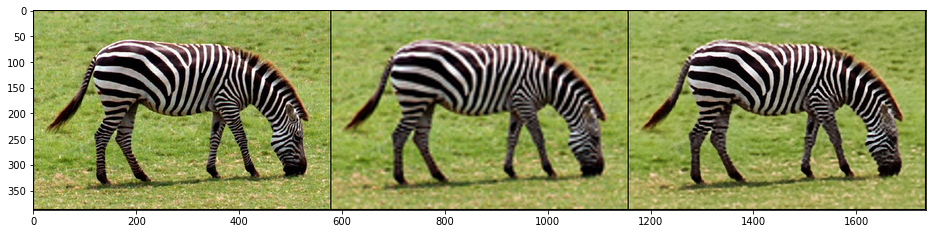

Iteration 01101    PSNR_LR 30.435   PSNR_HR 23.515Iteration 01102    PSNR_LR 30.352   PSNR_HR 23.541Iteration 01103    PSNR_LR 30.487   PSNR_HR 23.540Iteration 01104    PSNR_LR 30.330   PSNR_HR 23.463Iteration 01105    PSNR_LR 30.414   PSNR_HR 23.551Iteration 01106    PSNR_LR 30.235   PSNR_HR 23.482Iteration 01107    PSNR_LR 30.438   PSNR_HR 23.564Iteration 01108    PSNR_LR 30.471   PSNR_HR 23.579Iteration 01109    PSNR_LR 30.329   PSNR_HR 23.477Iteration 01110    PSNR_LR 30.387   PSNR_HR 23.489Iteration 01111    PSNR_LR 30.415   PSNR_HR 23.538Iteration 01112    PSNR_LR 30.374   PSNR_HR 23.487Iteration 01113    PSNR_LR 30.241   PSNR_HR 23.490Iteration 01114    PSNR_LR 30.458   PSNR_HR 23.568Iteration 01115    PSNR_LR 30.449   PSNR_HR 23.514Iteration 01116    PSNR_LR 30.167   PSNR_HR 23.453Iteration 01117    PSNR_LR 30.505   PSNR_HR 23.559Iteration 01118    PSNR_LR 30.360   PSNR_HR 23.541Iteration 01119    PSNR_LR 30.052   PSNR_HR 23.430Iteration 01120    PSNR_LR 30.323   PSNR_HR 23.430

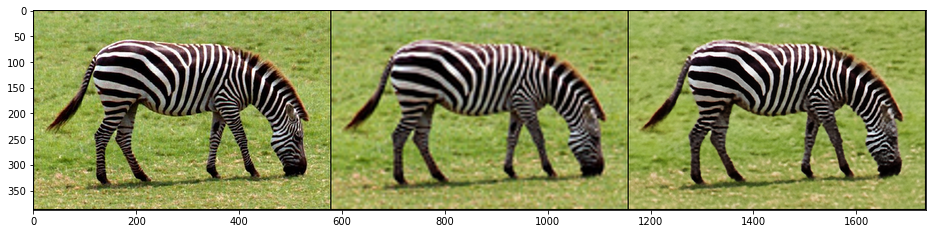

Iteration 01201    PSNR_LR 30.733   PSNR_HR 23.556Iteration 01202    PSNR_LR 30.692   PSNR_HR 23.618Iteration 01203    PSNR_LR 30.713   PSNR_HR 23.640Iteration 01204    PSNR_LR 30.468   PSNR_HR 23.549Iteration 01205    PSNR_LR 30.816   PSNR_HR 23.605Iteration 01206    PSNR_LR 30.532   PSNR_HR 23.545Iteration 01207    PSNR_LR 30.538   PSNR_HR 23.549Iteration 01208    PSNR_LR 30.414   PSNR_HR 23.560Iteration 01209    PSNR_LR 30.690   PSNR_HR 23.594Iteration 01210    PSNR_LR 30.654   PSNR_HR 23.611Iteration 01211    PSNR_LR 30.510   PSNR_HR 23.597Iteration 01212    PSNR_LR 30.512   PSNR_HR 23.546Iteration 01213    PSNR_LR 30.953   PSNR_HR 23.649Iteration 01214    PSNR_LR 30.525   PSNR_HR 23.588Iteration 01215    PSNR_LR 30.570   PSNR_HR 23.550Iteration 01216    PSNR_LR 30.716   PSNR_HR 23.567Iteration 01217    PSNR_LR 30.613   PSNR_HR 23.557Iteration 01218    PSNR_LR 30.590   PSNR_HR 23.589Iteration 01219    PSNR_LR 30.677   PSNR_HR 23.653Iteration 01220    PSNR_LR 30.671   PSNR_HR 23.590

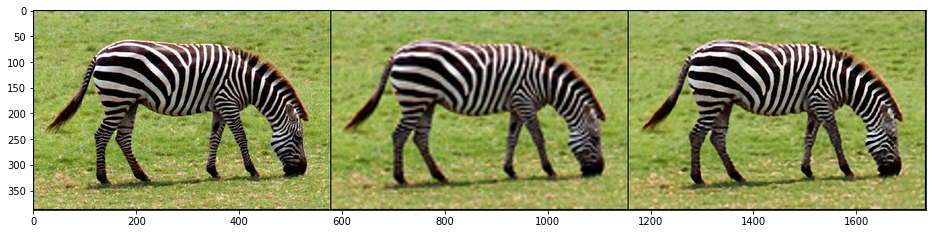

Iteration 01301    PSNR_LR 30.935   PSNR_HR 23.679Iteration 01302    PSNR_LR 30.916   PSNR_HR 23.642Iteration 01303    PSNR_LR 31.033   PSNR_HR 23.720Iteration 01304    PSNR_LR 31.164   PSNR_HR 23.790Iteration 01305    PSNR_LR 31.142   PSNR_HR 23.767Iteration 01306    PSNR_LR 30.955   PSNR_HR 23.688Iteration 01307    PSNR_LR 31.031   PSNR_HR 23.616Iteration 01308    PSNR_LR 30.949   PSNR_HR 23.615Iteration 01309    PSNR_LR 31.081   PSNR_HR 23.683Iteration 01310    PSNR_LR 30.986   PSNR_HR 23.679Iteration 01311    PSNR_LR 31.059   PSNR_HR 23.734Iteration 01312    PSNR_LR 31.109   PSNR_HR 23.700Iteration 01313    PSNR_LR 31.255   PSNR_HR 23.763Iteration 01314    PSNR_LR 31.157   PSNR_HR 23.722Iteration 01315    PSNR_LR 31.150   PSNR_HR 23.715Iteration 01316    PSNR_LR 31.237   PSNR_HR 23.757Iteration 01317    PSNR_LR 31.141   PSNR_HR 23.704Iteration 01318    PSNR_LR 31.040   PSNR_HR 23.698Iteration 01319    PSNR_LR 31.053   PSNR_HR 23.754Iteration 01320    PSNR_LR 31.115   PSNR_HR 23.677

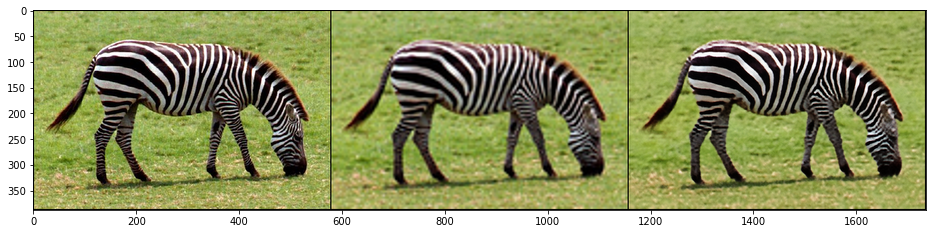

Iteration 01401    PSNR_LR 31.379   PSNR_HR 23.776Iteration 01402    PSNR_LR 31.162   PSNR_HR 23.670Iteration 01403    PSNR_LR 31.380   PSNR_HR 23.800Iteration 01404    PSNR_LR 31.342   PSNR_HR 23.791Iteration 01405    PSNR_LR 31.364   PSNR_HR 23.759Iteration 01406    PSNR_LR 31.328   PSNR_HR 23.737Iteration 01407    PSNR_LR 31.326   PSNR_HR 23.716Iteration 01408    PSNR_LR 31.198   PSNR_HR 23.687Iteration 01409    PSNR_LR 31.120   PSNR_HR 23.757Iteration 01410    PSNR_LR 31.495   PSNR_HR 23.839Iteration 01411    PSNR_LR 31.452   PSNR_HR 23.839Iteration 01412    PSNR_LR 31.363   PSNR_HR 23.770Iteration 01413    PSNR_LR 31.345   PSNR_HR 23.755Iteration 01414    PSNR_LR 31.524   PSNR_HR 23.799Iteration 01415    PSNR_LR 31.461   PSNR_HR 23.805Iteration 01416    PSNR_LR 31.524   PSNR_HR 23.818Iteration 01417    PSNR_LR 31.464   PSNR_HR 23.786Iteration 01418    PSNR_LR 31.269   PSNR_HR 23.676Iteration 01419    PSNR_LR 31.644   PSNR_HR 23.796Iteration 01420    PSNR_LR 31.509   PSNR_HR 23.851

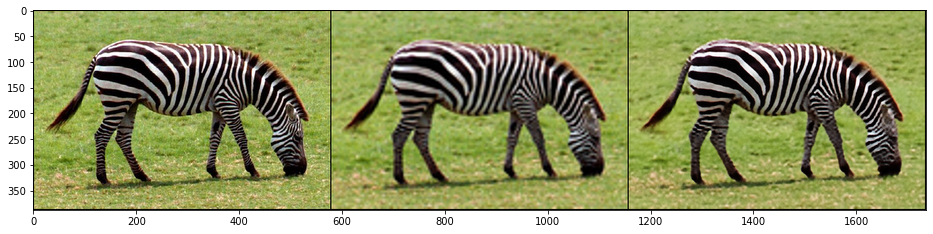

Iteration 01501    PSNR_LR 31.707   PSNR_HR 23.842Iteration 01502    PSNR_LR 31.679   PSNR_HR 23.777Iteration 01503    PSNR_LR 31.660   PSNR_HR 23.821Iteration 01504    PSNR_LR 31.509   PSNR_HR 23.841Iteration 01505    PSNR_LR 31.693   PSNR_HR 23.857Iteration 01506    PSNR_LR 31.754   PSNR_HR 23.894Iteration 01507    PSNR_LR 31.654   PSNR_HR 23.847Iteration 01508    PSNR_LR 31.553   PSNR_HR 23.866Iteration 01509    PSNR_LR 31.617   PSNR_HR 23.879Iteration 01510    PSNR_LR 31.889   PSNR_HR 23.887Iteration 01511    PSNR_LR 31.760   PSNR_HR 23.831Iteration 01512    PSNR_LR 31.761   PSNR_HR 23.878Iteration 01513    PSNR_LR 31.806   PSNR_HR 23.874Iteration 01514    PSNR_LR 31.772   PSNR_HR 23.861Iteration 01515    PSNR_LR 31.828   PSNR_HR 23.864Iteration 01516    PSNR_LR 31.815   PSNR_HR 23.933Iteration 01517    PSNR_LR 31.739   PSNR_HR 23.883Iteration 01518    PSNR_LR 31.849   PSNR_HR 23.891Iteration 01519    PSNR_LR 31.810   PSNR_HR 23.864Iteration 01520    PSNR_LR 31.948   PSNR_HR 23.918

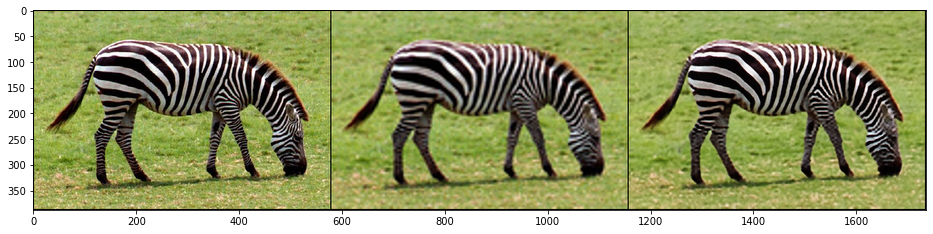

Iteration 01601    PSNR_LR 32.069   PSNR_HR 23.936Iteration 01602    PSNR_LR 32.264   PSNR_HR 23.973Iteration 01603    PSNR_LR 32.146   PSNR_HR 23.955Iteration 01604    PSNR_LR 32.126   PSNR_HR 23.971Iteration 01605    PSNR_LR 31.935   PSNR_HR 23.884Iteration 01606    PSNR_LR 31.977   PSNR_HR 23.931Iteration 01607    PSNR_LR 32.064   PSNR_HR 23.875Iteration 01608    PSNR_LR 31.904   PSNR_HR 23.904Iteration 01609    PSNR_LR 32.004   PSNR_HR 23.949Iteration 01610    PSNR_LR 32.033   PSNR_HR 23.956Iteration 01611    PSNR_LR 31.720   PSNR_HR 23.851Iteration 01612    PSNR_LR 32.164   PSNR_HR 23.990Iteration 01613    PSNR_LR 31.840   PSNR_HR 23.904Iteration 01614    PSNR_LR 31.938   PSNR_HR 23.872Iteration 01615    PSNR_LR 31.810   PSNR_HR 23.832Iteration 01616    PSNR_LR 32.117   PSNR_HR 23.911Iteration 01617    PSNR_LR 31.819   PSNR_HR 23.892Iteration 01618    PSNR_LR 32.089   PSNR_HR 23.906Iteration 01619    PSNR_LR 31.882   PSNR_HR 23.920Iteration 01620    PSNR_LR 32.035   PSNR_HR 23.952

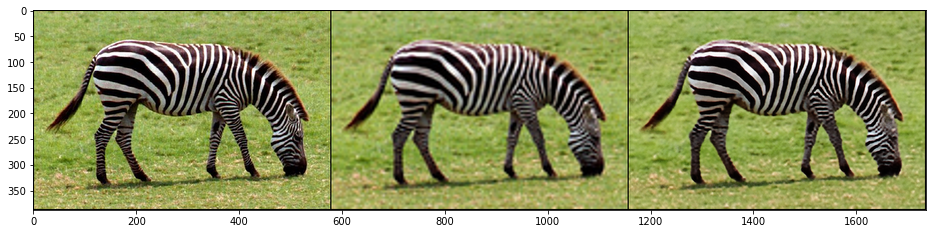

Iteration 01701    PSNR_LR 32.509   PSNR_HR 24.056Iteration 01702    PSNR_LR 32.295   PSNR_HR 24.003Iteration 01703    PSNR_LR 32.212   PSNR_HR 24.001Iteration 01704    PSNR_LR 32.385   PSNR_HR 23.948Iteration 01705    PSNR_LR 32.221   PSNR_HR 23.950Iteration 01706    PSNR_LR 31.994   PSNR_HR 23.927Iteration 01707    PSNR_LR 32.279   PSNR_HR 24.026Iteration 01708    PSNR_LR 32.220   PSNR_HR 23.956Iteration 01709    PSNR_LR 32.059   PSNR_HR 23.917Iteration 01710    PSNR_LR 31.970   PSNR_HR 23.912Iteration 01711    PSNR_LR 32.227   PSNR_HR 23.998Iteration 01712    PSNR_LR 32.154   PSNR_HR 23.909Iteration 01713    PSNR_LR 32.120   PSNR_HR 23.911Iteration 01714    PSNR_LR 32.191   PSNR_HR 24.005Iteration 01715    PSNR_LR 32.180   PSNR_HR 23.945Iteration 01716    PSNR_LR 32.146   PSNR_HR 23.953Iteration 01717    PSNR_LR 32.090   PSNR_HR 24.013Iteration 01718    PSNR_LR 32.456   PSNR_HR 24.015Iteration 01719    PSNR_LR 32.136   PSNR_HR 23.941Iteration 01720    PSNR_LR 32.290   PSNR_HR 23.970

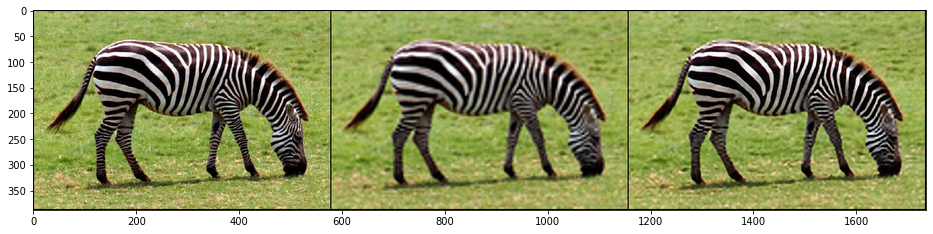

Iteration 01801    PSNR_LR 32.691   PSNR_HR 24.053Iteration 01802    PSNR_LR 32.539   PSNR_HR 24.064Iteration 01803    PSNR_LR 32.442   PSNR_HR 23.987Iteration 01804    PSNR_LR 32.683   PSNR_HR 24.088Iteration 01805    PSNR_LR 32.640   PSNR_HR 24.038Iteration 01806    PSNR_LR 32.456   PSNR_HR 24.021Iteration 01807    PSNR_LR 32.331   PSNR_HR 24.095Iteration 01808    PSNR_LR 32.473   PSNR_HR 23.976Iteration 01809    PSNR_LR 32.709   PSNR_HR 24.042Iteration 01810    PSNR_LR 32.363   PSNR_HR 24.028Iteration 01811    PSNR_LR 32.307   PSNR_HR 23.983Iteration 01812    PSNR_LR 32.687   PSNR_HR 24.086Iteration 01813    PSNR_LR 32.735   PSNR_HR 24.097Iteration 01814    PSNR_LR 32.402   PSNR_HR 23.977Iteration 01815    PSNR_LR 32.819   PSNR_HR 24.135Iteration 01816    PSNR_LR 32.825   PSNR_HR 24.143Iteration 01817    PSNR_LR 32.662   PSNR_HR 24.039Iteration 01818    PSNR_LR 32.640   PSNR_HR 24.050Iteration 01819    PSNR_LR 32.737   PSNR_HR 24.077Iteration 01820    PSNR_LR 32.787   PSNR_HR 24.075

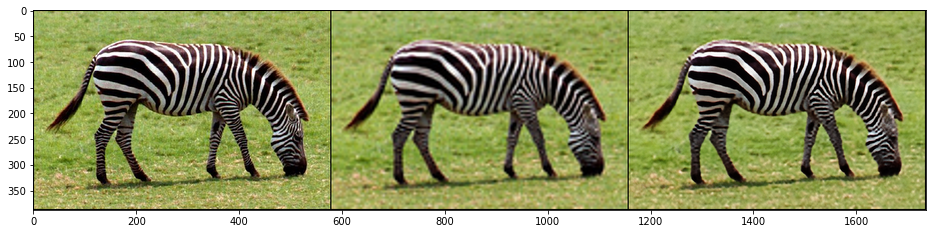

Iteration 01901    PSNR_LR 32.646   PSNR_HR 24.047Iteration 01902    PSNR_LR 32.986   PSNR_HR 24.103Iteration 01903    PSNR_LR 32.721   PSNR_HR 24.044Iteration 01904    PSNR_LR 32.940   PSNR_HR 24.113Iteration 01905    PSNR_LR 32.896   PSNR_HR 24.126Iteration 01906    PSNR_LR 32.758   PSNR_HR 24.048Iteration 01907    PSNR_LR 32.933   PSNR_HR 24.117Iteration 01908    PSNR_LR 32.690   PSNR_HR 24.068Iteration 01909    PSNR_LR 32.961   PSNR_HR 24.124Iteration 01910    PSNR_LR 33.026   PSNR_HR 24.145Iteration 01911    PSNR_LR 32.942   PSNR_HR 24.119Iteration 01912    PSNR_LR 32.977   PSNR_HR 24.147Iteration 01913    PSNR_LR 32.762   PSNR_HR 24.075Iteration 01914    PSNR_LR 32.868   PSNR_HR 24.105Iteration 01915    PSNR_LR 32.831   PSNR_HR 24.074Iteration 01916    PSNR_LR 33.015   PSNR_HR 24.106Iteration 01917    PSNR_LR 32.798   PSNR_HR 24.086Iteration 01918    PSNR_LR 33.004   PSNR_HR 24.149Iteration 01919    PSNR_LR 32.834   PSNR_HR 24.077Iteration 01920    PSNR_LR 32.939   PSNR_HR 24.085

In [7]:
psnr_history = [] 
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

i = 0
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


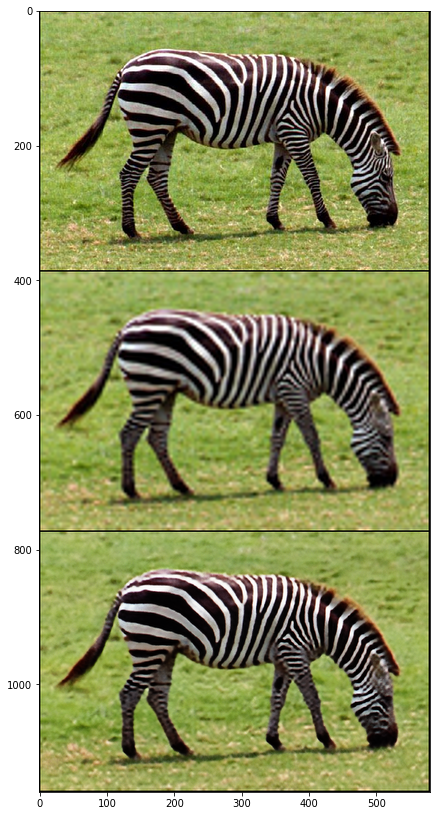

In [27]:
out_HR_np = np.clip(torch_to_np(net(net_input)), 0, 1)
result_deep_prior = put_in_center(out_HR_np, imgs['orig_np'].shape[1:])

# For the paper we acually took `_bicubic.png` files from LapSRN viewer and used `result_deep_prior` as our result
plot_image_grid([imgs['HR_np'],
                 imgs['bicubic_np'],
                 out_HR_np], factor=4, nrow=1);

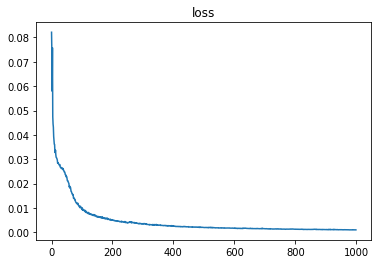

In [28]:
# print(loss)
plt.title('loss')
plt.plot(loss)

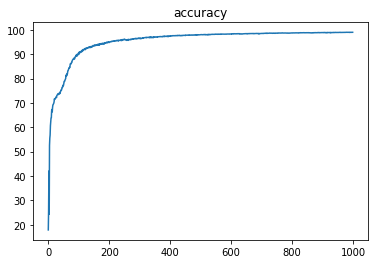

In [29]:
acc=[]
acc= 100-(loss*1000)
plt.show()
# acc=acc[:-500]
# print(acc[-1])
# print (acc.shape)

plt.title('accuracy')
plt.plot(acc)
plt.show()
# plt.title('psnr')
# plt.plot(PSNR[:,0])

In [0]:
!apt install caffe-cuda

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import caffe
import os
import skimage.color as color
import scipy.ndimage.interpolation as sni

%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 6)